In [1]:
!git clone https://github.com/yz93/LAVT-RIS.git

# Define the updated content of _utils.py with Y1 (x_c4) return
updated_utils_code = """
from collections import OrderedDict
import sys
import torch
from torch import nn
from torch.nn import functional as F
from bert.modeling_bert import BertModel


class _LAVTSimpleDecode(nn.Module):
    def __init__(self, backbone, classifier):
        super(_LAVTSimpleDecode, self).__init__()
        self.backbone = backbone
        self.classifier = classifier

    def forward(self, x, l_feats, l_mask):
        input_shape = x.shape[-2:]
        features = self.backbone(x, l_feats, l_mask)
        x_c1, x_c2, x_c3, x_c4 = features
        x = self.classifier(x_c4, x_c3, x_c2, x_c1)
        x = F.interpolate(x, size=input_shape, mode='bilinear', align_corners=True)

        return x_c1, x_c2, x_c3, x_c4, x


class LAVT(_LAVTSimpleDecode):
    pass


###############################################
# LAVT One: put BERT inside the overall model #
###############################################
class _LAVTOneSimpleDecode(nn.Module):
    def __init__(self, backbone, classifier, args):
        super(_LAVTOneSimpleDecode, self).__init__()
        self.backbone = backbone
        self.classifier = classifier
        self.text_encoder = BertModel.from_pretrained(args.ck_bert)
        self.text_encoder.pooler = None

    def forward(self, x, text, l_mask):
        input_shape = x.shape[-2:]
        ### language inference ###
        l_feats = self.text_encoder(text, attention_mask=l_mask)[0]  # (6, 10, 768)
        l_feats = l_feats.permute(0, 2, 1)  # (B, 768, N_l) to make Conv1d happy
        l_mask = l_mask.unsqueeze(dim=-1)  # (batch, N_l, 1)
        ##########################
        features = self.backbone(x, l_feats, l_mask)
        x_c1, x_c2, x_c3, x_c4 = features
        x = self.classifier(x_c4, x_c3, x_c2, x_c1)
        x = F.interpolate(x, size=input_shape, mode='bilinear', align_corners=True)

        return x


class LAVTOne(_LAVTOneSimpleDecode):
    pass
"""

# Write to the file
with open('/kaggle/working/LAVT-RIS/lib/_utils.py', 'w') as f:
    f.write(updated_utils_code)

print("✅ Rewritten /kaggle/working/LAVT-RIS/lib/_utils.py with Y1 feature output.")

Cloning into 'LAVT-RIS'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 131 (delta 15), reused 12 (delta 12), pack-reused 107 (from 1)
Receiving objects: 100% (131/131), 6.92 MiB | 22.27 MiB/s, done.
Resolving deltas: 100% (28/28), done.
✅ Rewritten /kaggle/working/LAVT-RIS/lib/_utils.py with Y1 feature output.


In [2]:
!pip install h5py
!pip install timm
!pip install mmcv==1.3.12
!pip install mmsegmentation==0.17.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 4.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 90.9 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing installation: nvidia-curand-cu12 10.3.9.90
    Uninstalling nvidia-curand-cu12-1

In [3]:
%cd LAVT-RIS

/kaggle/working/LAVT-RIS


In [4]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.5/309.5 kB 19.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 10.6 MB/s eta 0:00:0000:0100:01m
  error: subprocess-exited-with-error
  
  × pip subprocess to install build dependencies did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Installing build dependencies ... error
error: subprocess-exited-with-error

× pip subprocess to install build dependencies did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


In [5]:
!mkdir ./checkpoints
!gdown 13D-OeEOijV8KTC3BkFP-gOJymc6DLwVT -O checkpoints/
!wget https://github.com/SwinTransformer/storage/releases/download/v1.0.0/swin_base_patch4_window12_384_22k.pth

Downloading...
From (original): https://drive.google.com/uc?id=13D-OeEOijV8KTC3BkFP-gOJymc6DLwVT
From (redirected): https://drive.google.com/uc?id=13D-OeEOijV8KTC3BkFP-gOJymc6DLwVT&confirm=t&uuid=9b97863f-d24e-43b3-ad46-b6695a942b0e
To: /kaggle/working/LAVT-RIS/checkpoints/refcoco.pth
100%|██████████████████████████████████████| 2.42G/2.42G [02:10<00:00, 18.5MB/s]


/tmp/ipykernel_31/396225374.py:10: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


Window size 12!
Initializing Multi-modal Swin Transformer weights from /kaggle/working/LAVT-RIS/swin_base_patch4_window12_384_22k.pth


/tmp/ipykernel_31/396225374.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(weights, map_location='cpu')


(128, 120, 159) (1024, 15, 20) torch.Size([1, 3, 480, 635])


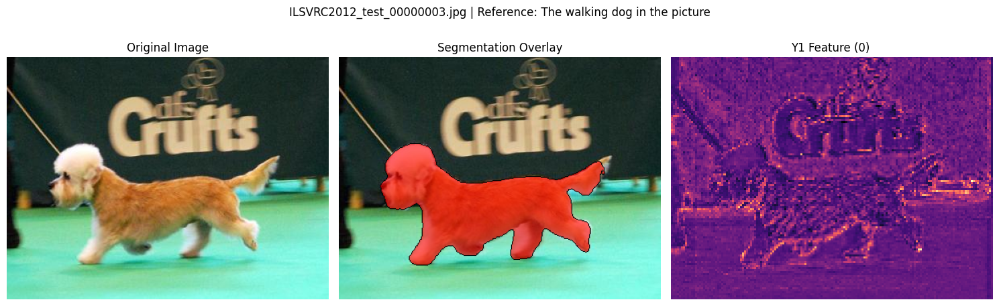

(128, 120, 131) (1024, 15, 17) torch.Size([1, 3, 480, 524])


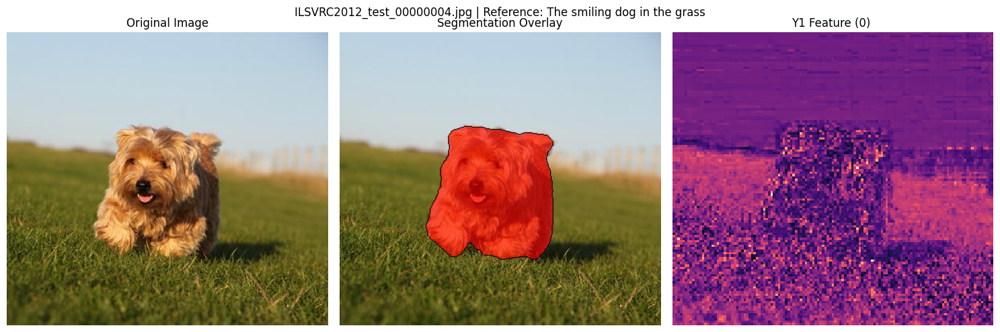

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


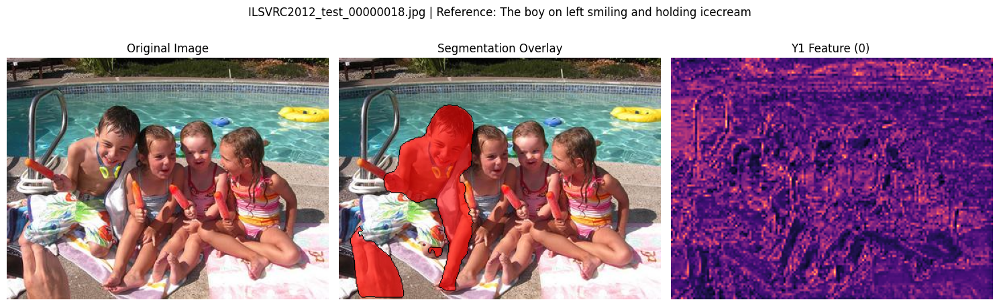

(128, 120, 150) (1024, 15, 19) torch.Size([1, 3, 480, 600])


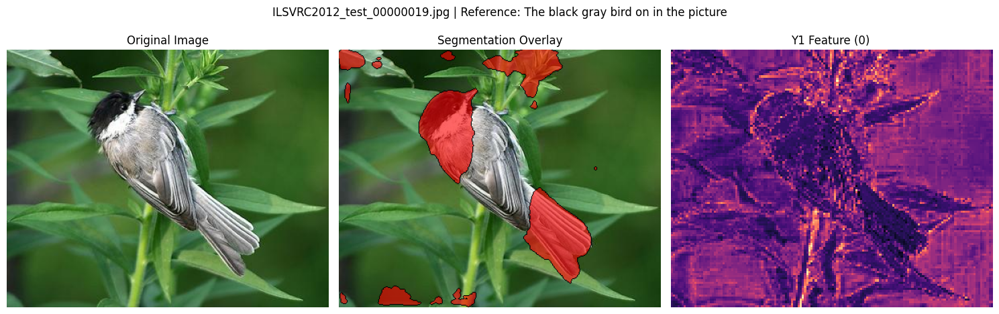

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


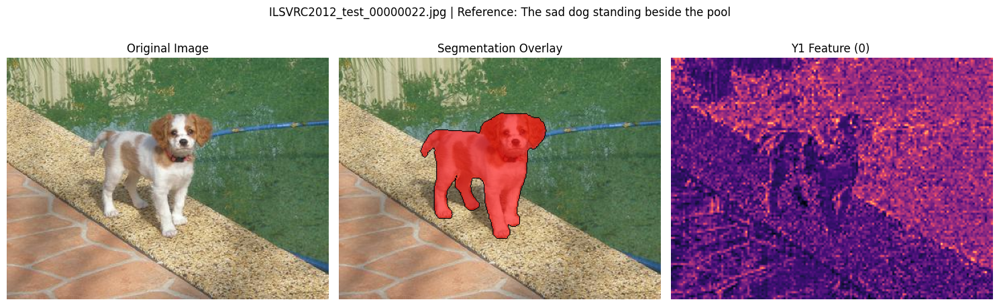

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


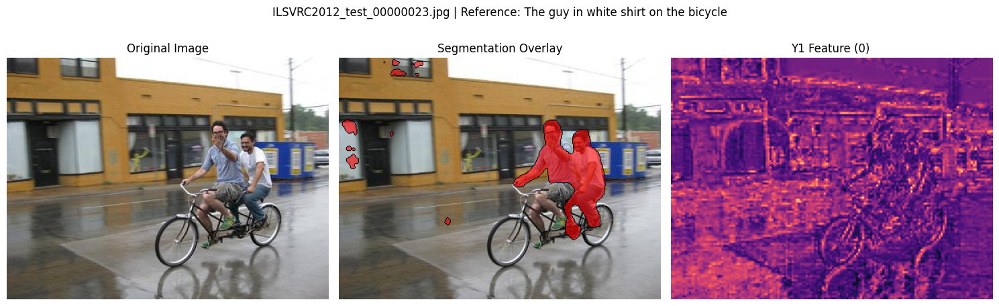

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


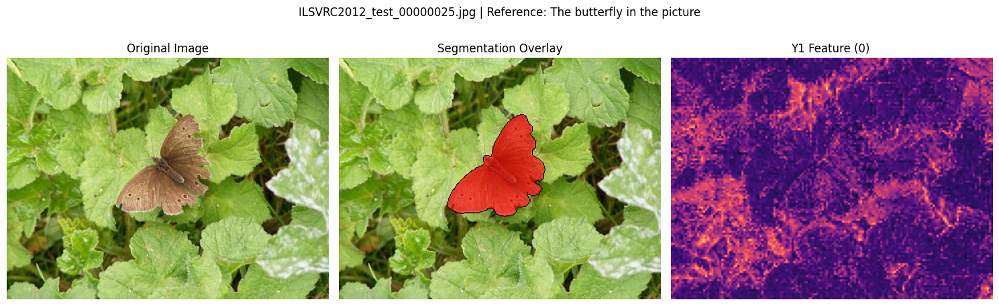

(128, 149, 120) (1024, 19, 15) torch.Size([1, 3, 594, 480])


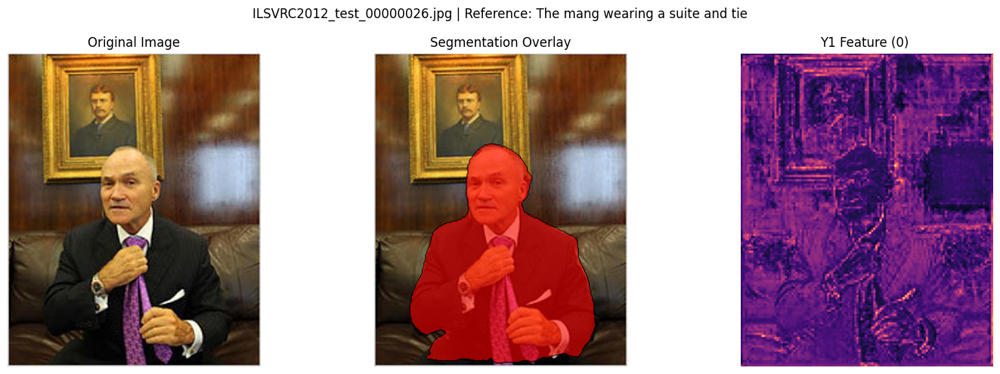

(128, 120, 121) (1024, 15, 16) torch.Size([1, 3, 480, 484])


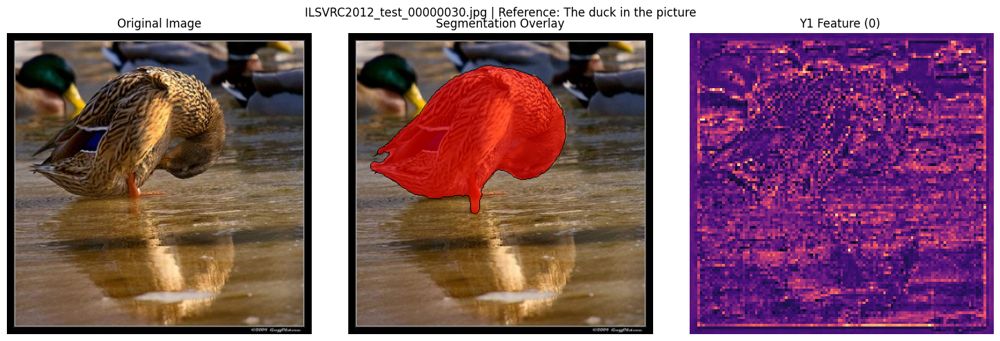

(128, 141, 120) (1024, 18, 15) torch.Size([1, 3, 561, 480])


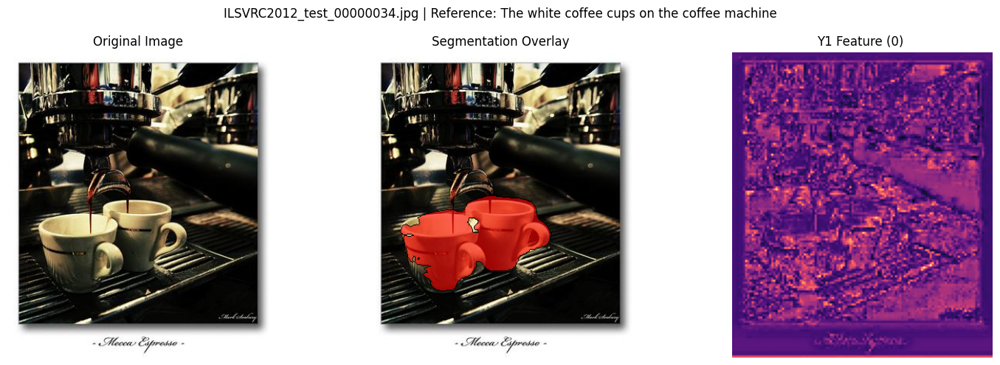

In [25]:
import os
from PIL import Image
import numpy as np
import torch
from torchvision import transforms as T
import torch.nn.functional as F
from bert.tokenization_bert import BertTokenizer
from bert.modeling_bert import BertModel
from lib import segmentation
from scipy.ndimage.morphology import binary_dilation
import matplotlib.pyplot as plt

# Dictionary of image filename and corresponding reference for segmentation
image_reference_dict = {
    "ILSVRC2012_test_00000003.jpg": "The walking dog in the picture",
    "ILSVRC2012_test_00000004.jpg": "The smiling dog in the grass",
    "ILSVRC2012_test_00000018.jpg": "The boy on left smiling and holding icecream",
    "ILSVRC2012_test_00000019.jpg": "The black gray bird on in the picture",
    "ILSVRC2012_test_00000022.jpg": "The sad dog standing beside the pool",
    "ILSVRC2012_test_00000023.jpg": "The guy in white shirt on the bicycle",
    "ILSVRC2012_test_00000025.jpg": "The butterfly in the picture",
    "ILSVRC2012_test_00000026.jpg": "The mang wearing a suite and tie",
    "ILSVRC2012_test_00000030.jpg": "The duck in the picture",
    "ILSVRC2012_test_00000034.jpg": "The white coffee cups on the coffee machine"
}

# Setup
image_folder = '/kaggle/input/cv-assgn3/samples'
weights = './checkpoints/refcoco.pth'
device = 'cuda:0'

# Transforms
image_transforms = T.Compose([
    T.Resize(480),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# BERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model_class = BertModel

# Model setup
class args:
    swin_type = 'base'
    window12 = True
    mha = ''
    fusion_drop = 0.0

single_model = segmentation.__dict__['lavt'](pretrained='/kaggle/working/LAVT-RIS/swin_base_patch4_window12_384_22k.pth', args=args).to(device)
single_bert_model = model_class.from_pretrained('bert-base-uncased')
single_bert_model.pooler = None

checkpoint = torch.load(weights, map_location='cpu')
single_bert_model.load_state_dict(checkpoint['bert_model'])
single_model.load_state_dict(checkpoint['model'])
model = single_model.to(device)
bert_model = single_bert_model.to(device)

# Overlay function
def overlay_davis(image, mask, colors=[[0, 0, 0], [255, 0, 0]], cscale=1, alpha=0.4):
    colors = np.reshape(colors, (-1, 3))
    colors = np.atleast_2d(colors) * cscale
    im_overlay = image.copy()
    object_ids = np.unique(mask)
    for object_id in object_ids[1:]:
        foreground = image*alpha + np.ones(image.shape)*(1-alpha) * np.array(colors[object_id])
        binary_mask = mask == object_id
        im_overlay[binary_mask] = foreground[binary_mask]
        countours = binary_dilation(binary_mask) ^ binary_mask
        im_overlay[countours, :] = 0
    return im_overlay.astype(image.dtype)

def demo_inference(image_reference_dict):
    for filename, reference in image_reference_dict.items():
        image_path = os.path.join(image_folder, filename)
        
        # Load and transform image
        img = Image.open(image_path).convert("RGB")
        img_ndarray = np.array(img)
        original_w, original_h = img.size
        img_tensor = image_transforms(img).unsqueeze(0).to(device)
    
        # Process reference
        reference_tokenized = tokenizer.encode(text=reference, add_special_tokens=True)[:20]
        padded_sent_toks = [0] * 20
        padded_sent_toks[:len(reference_tokenized)] = reference_tokenized
        attention_mask = [0] * 20
        attention_mask[:len(reference_tokenized)] = [1]*len(reference_tokenized)
        padded_sent_toks = torch.tensor(padded_sent_toks).unsqueeze(0).to(device)
        attention_mask = torch.tensor(attention_mask).unsqueeze(0).to(device)
    
        # Inference
        last_hidden_states = bert_model(padded_sent_toks, attention_mask=attention_mask)[0]
        embedding = last_hidden_states.permute(0, 2, 1)
        x_c1, x_c2, x_c3, x_c4, output = model(img_tensor, embedding, l_mask=attention_mask.unsqueeze(-1))
        output = output.argmax(1, keepdim=True)
        output = F.interpolate(output.float(), (original_h, original_w))
        output = output.squeeze().cpu().data.numpy().astype(np.uint8)
    
        x_c1 = x_c1.squeeze(0).detach().cpu().numpy()  # (C, H, W)
        x_c4 = x_c4.squeeze(0).detach().cpu().numpy()  # (C, H, W)
        print(x_c1.shape, x_c4.shape, img_tensor.shape)
    
        # Visualize
        visualization = overlay_davis(img_ndarray, output)
    
        # Plot side-by-side (3 images)
        plt.figure(figsize=(15, 5))
        plt.suptitle(filename + " | Reference: "+ reference)
        
        # Show original image
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis("off")
        
        # Show binary mask
        plt.subplot(1, 3, 2)
        plt.imshow(visualization)
        plt.title("Segmentation Overlay")
        plt.axis("off")
        
        # Add Y1 
        plt.subplot(1, 3, 3)
        plt.imshow(x_c1[0], cmap='magma')  # or use `cmap='gray'` if grayscale
        plt.title("Y1 Feature (0) ")
        plt.axis("off")
        
        plt.tight_layout()
        plt.show()

demo_inference(image_reference_dict)

(128, 120, 159) (1024, 15, 20) torch.Size([1, 3, 480, 635])


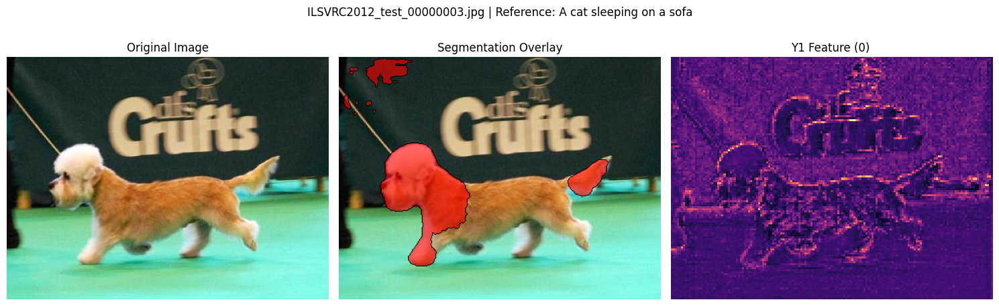

(128, 120, 131) (1024, 15, 17) torch.Size([1, 3, 480, 524])


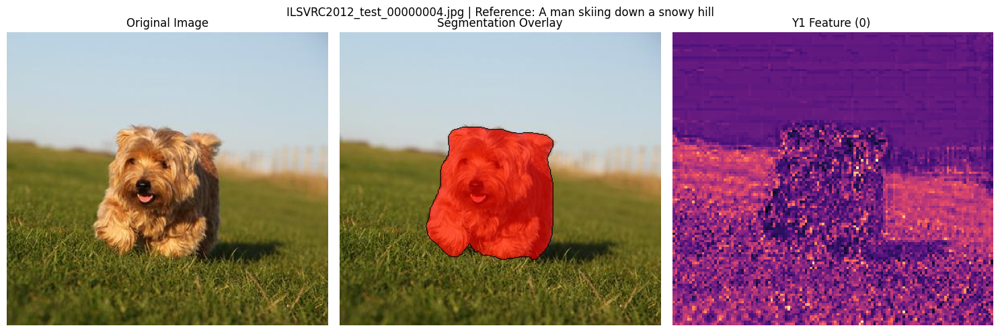

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


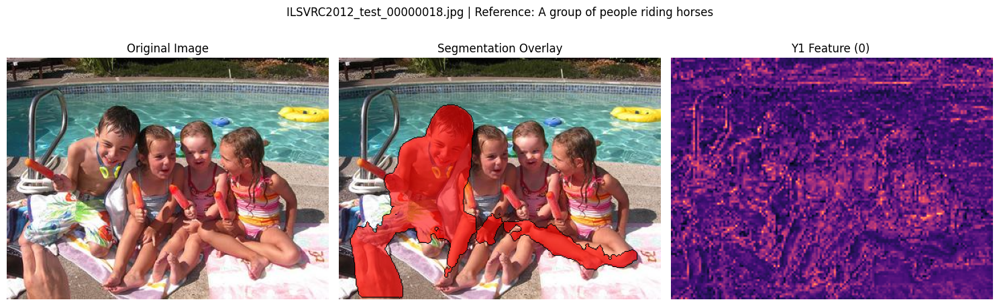

(128, 120, 150) (1024, 15, 19) torch.Size([1, 3, 480, 600])


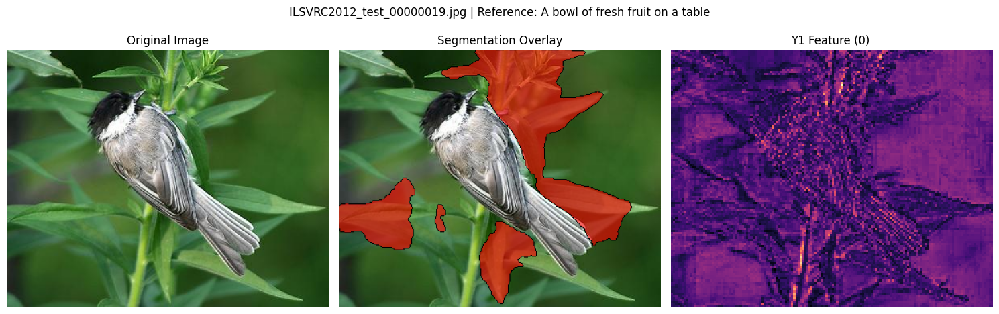

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


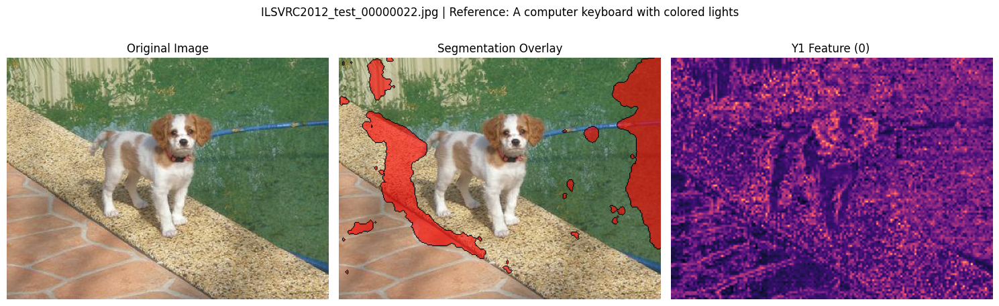

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


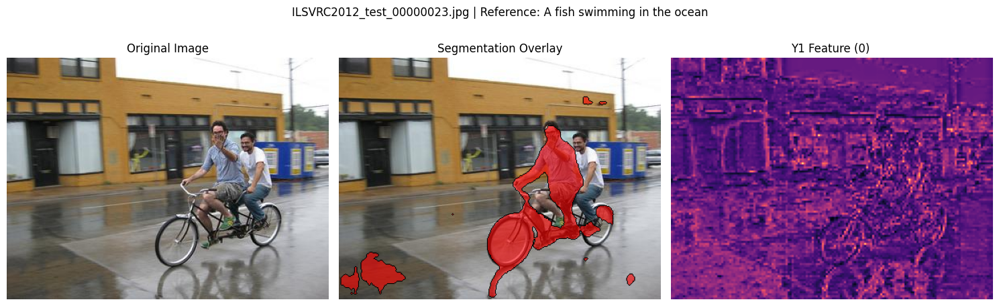

(128, 120, 160) (1024, 15, 20) torch.Size([1, 3, 480, 640])


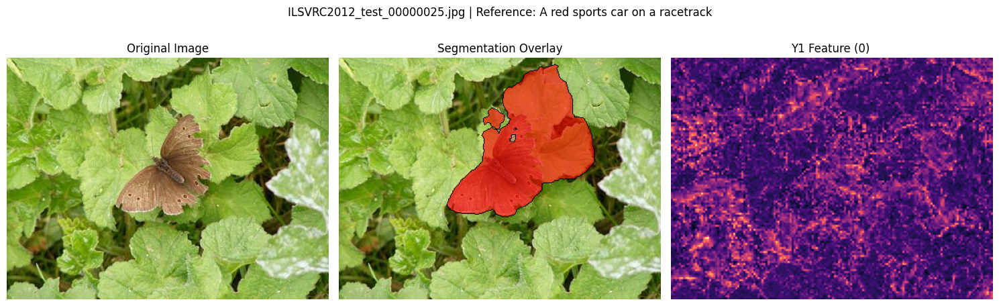

(128, 149, 120) (1024, 19, 15) torch.Size([1, 3, 594, 480])


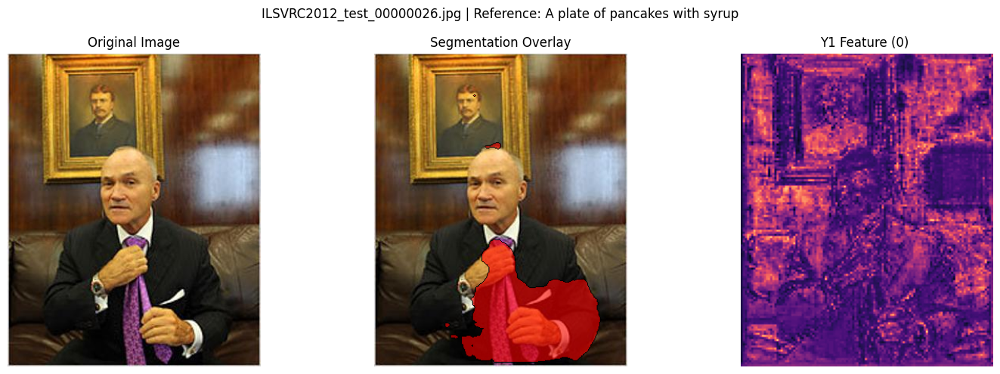

(128, 120, 121) (1024, 15, 16) torch.Size([1, 3, 480, 484])


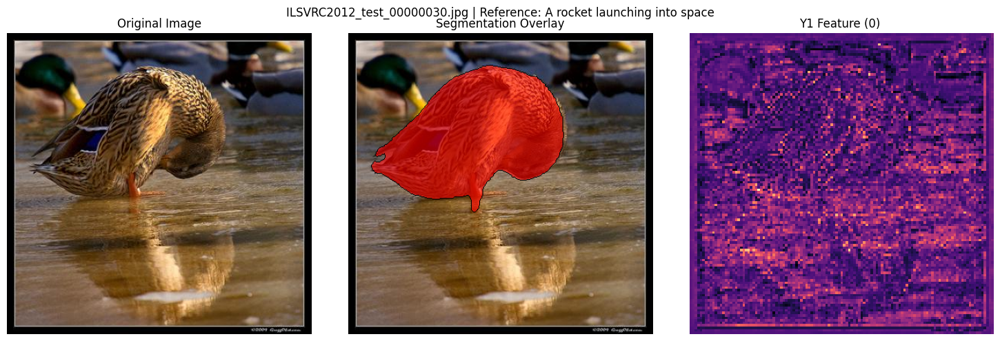

(128, 141, 120) (1024, 18, 15) torch.Size([1, 3, 561, 480])


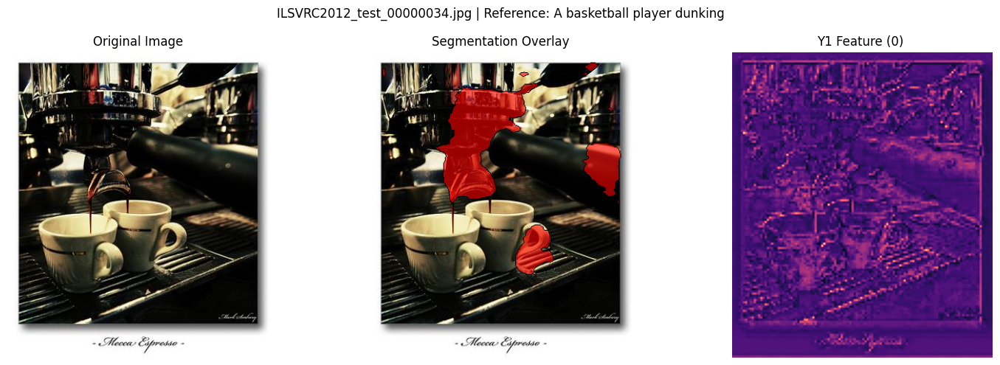

In [27]:
# Dictionary of image filename and corresponding reference for segmentation
failure_image_reference_dict = {
    "ILSVRC2012_test_00000003.jpg": "A cat sleeping on a sofa",
    "ILSVRC2012_test_00000004.jpg": "A man skiing down a snowy hill",
    "ILSVRC2012_test_00000018.jpg": "A group of people riding horses",
    "ILSVRC2012_test_00000019.jpg": "A bowl of fresh fruit on a table",
    "ILSVRC2012_test_00000022.jpg": "A computer keyboard with colored lights",
    "ILSVRC2012_test_00000023.jpg": "A fish swimming in the ocean",
    "ILSVRC2012_test_00000025.jpg": "A red sports car on a racetrack",
    "ILSVRC2012_test_00000026.jpg": "A plate of pancakes with syrup",
    "ILSVRC2012_test_00000030.jpg": "A rocket launching into space",
    "ILSVRC2012_test_00000034.jpg": "A basketball player dunking"
}

demo_inference(failure_image_reference_dict)